In [1]:
from pycitylayers.client import Client
from pycitylayers.utils import PointGQL, PolygonGQL
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from shapely.geometry import Polygon, Point, MultiPolygon
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import geopandas as gpd
import contextily as cx
from tqdm import tqdm
import json
import utilities as ut


In [2]:
HQ_data=pd.read_parquet(r'C:\Users\m_hamsai\OneDrive - Concordia University - Canada\HQ dataset\HQ_dataset.parquet')
HQ_data.head()

,CP3,Secteur,DateIntervalUTC,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients
0,G1B,COM,2019-01-28T07:45:00.000Z,212.33,1.55,5.60,0.979,140.0
1,G1B,COM,2022-03-23T00:45:00.000Z,204.66,1.46,5.14,1.000,140.0
2,G1B,COM,2020-06-07T13:45:00.000Z,185.66,1.35,5.16,0.986,140.0
3,G1B,COM,2019-06-11T15:45:00.000Z,213.05,1.56,5.53,0.979,140.0
4,G1B,COM,2022-03-13T09:15:00.000Z,175.64,1.25,4.31,1.000,140.0


In [39]:
HQ_data.tail()

,CP3,Secteur,DateIntervalUTC,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients
58462307,H4J,INS,2020-05-05T11:15:00.000Z,490.55,5.27,18.21,0.979,96.0
58462308,H4J,INS,2020-06-02T08:00:00.000Z,880.65,9.37,66.88,0.979,96.0
58462309,H4J,INS,2020-01-23T05:15:00.000Z,1223.82,13.02,68.12,0.979,96.0
58462310,H4J,INS,2020-10-23T20:30:00.000Z,1231.83,12.97,85.97,1.000,95.0
58462311,H4J,INS,2022-05-19T20:15:00.000Z,479.05,5.04,16.00,NaN,NaN


In [3]:
sum_CP3=HQ_data[HQ_data['Secteur']=='RES'].groupby(by='CP3').sum()
sum_CP3

C:\Users\m_hamsai\AppData\Local\Temp\ipykernel_12968\1102959584.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sum_CP3=HQ_data[HQ_data['Secteur']=='RES'].groupby(by='CP3').sum()


,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients
CP3,,,,,
G1B,5.654880e+08,84621.92,63164.81,138781.037,9.481166e+08
G1C,1.189313e+09,75048.31,120084.44,137366.149,2.272389e+09
G1E,8.377407e+08,60795.91,137156.86,136435.002,1.991653e+09
G1G,8.022789e+08,73632.57,92503.33,135852.494,1.579271e+09
G1H,8.938786e+08,64562.10,153909.13,135565.085,2.019263e+09
...,...,...,...,...,...
H4B,4.043170e+08,41213.14,158508.46,135763.553,1.424888e+09
H4C,4.856290e+08,50294.06,135712.01,137533.987,1.381013e+09
H4E,8.439508e+08,55530.37,83326.41,137905.248,2.168721e+09


<Axes: >

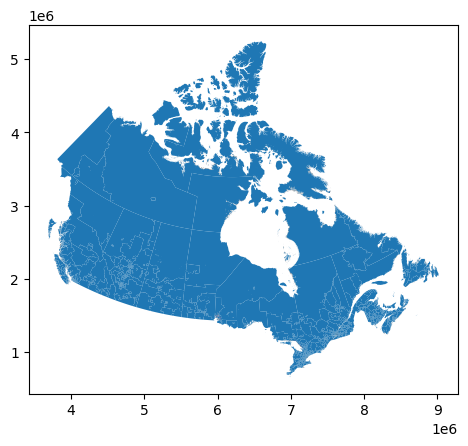

In [4]:
CA_CP3 = gpd.read_file(r'C:\Users\m_hamsai\Documents\GitHub\PyCityLayers-OB-extension\Postal code geometry\lfsa000b16a_e.shp')

# Plot the postal code boundaries
CA_CP3.plot()

In [5]:
QC_CP3=CA_CP3[CA_CP3['PRUID']=='24']
QC_CP3=QC_CP3.rename(columns={'CFSAUID':'CP3'})
QC_CP3

,CP3,PRUID,PRNAME,geometry
211,G1M,24,Quebec / Québec,"POLYGON ((7759210.377 1441197.986, 7759240.360..."
212,G1N,24,Quebec / Québec,"MULTIPOLYGON (((7760835.503 1439707.240, 77608..."
213,G1P,24,Quebec / Québec,"POLYGON ((7756136.363 1439841.640, 7756146.760..."
214,G1R,24,Quebec / Québec,"POLYGON ((7763358.686 1441215.763, 7763372.334..."
215,G1S,24,Quebec / Québec,"POLYGON ((7761635.006 1439345.709, 7761695.471..."
...,...,...,...,...
656,J8N,24,Quebec / Québec,"POLYGON ((7456801.897 1233921.449, 7456810.863..."
657,J8R,24,Quebec / Québec,"MULTIPOLYGON (((7481048.294 1205580.537, 74810..."
658,J8V,24,Quebec / Québec,"MULTIPOLYGON (((7467302.751 1199252.449, 74673..."
659,J8P,24,Quebec / Québec,"POLYGON ((7479207.671 1202254.646, 7479173.957..."


<Axes: >

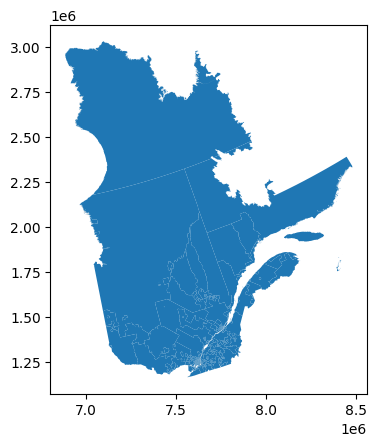

In [6]:
QC_CP3.plot()

In [7]:
merged_df = pd.merge(sum_CP3, QC_CP3, on='CP3')
merged_df

,CP3,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients,PRUID,PRNAME,geometry
0,G1B,5.654880e+08,84621.92,63164.81,138781.037,9.481166e+08,24,Quebec / Québec,"POLYGON ((7761288.271 1450426.083, 7761244.577..."
1,G1C,1.189313e+09,75048.31,120084.44,137366.149,2.272389e+09,24,Quebec / Québec,"POLYGON ((7762417.000 1451503.874, 7762470.500..."
2,G1E,8.377407e+08,60795.91,137156.86,136435.002,1.991653e+09,24,Quebec / Québec,"MULTIPOLYGON (((7764070.817 1448229.871, 77641..."
3,G1G,8.022789e+08,73632.57,92503.33,135852.494,1.579271e+09,24,Quebec / Québec,"POLYGON ((7754183.557 1447831.749, 7754017.737..."
4,G1H,8.938786e+08,64562.10,153909.13,135565.085,2.019263e+09,24,Quebec / Québec,"POLYGON ((7758002.654 1445779.977, 7758126.483..."
...,...,...,...,...,...,...,...,...,...
100,H4B,4.043170e+08,41213.14,158508.46,135763.553,1.424888e+09,24,Quebec / Québec,"POLYGON ((7629529.389 1239517.903, 7629448.463..."
101,H4C,4.856290e+08,50294.06,135712.01,137533.987,1.381013e+09,24,Quebec / Québec,"POLYGON ((7631675.117 1242119.714, 7631689.966..."
102,H4E,8.439508e+08,55530.37,83326.41,137905.248,2.168721e+09,24,Quebec / Québec,"POLYGON ((7632140.974 1241673.697, 7632167.169..."
103,H4G,7.696592e+08,46331.02,78637.93,138167.003,2.365916e+09,24,Quebec / Québec,"MULTIPOLYGON (((7633196.009 1241484.103, 76332..."


In [8]:
merged_gdf=gpd.GeoDataFrame(merged_df,geometry='geometry')
merged_gdf

,CP3,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients,PRUID,PRNAME,geometry
0,G1B,5.654880e+08,84621.92,63164.81,138781.037,9.481166e+08,24,Quebec / Québec,"POLYGON ((7761288.271 1450426.083, 7761244.577..."
1,G1C,1.189313e+09,75048.31,120084.44,137366.149,2.272389e+09,24,Quebec / Québec,"POLYGON ((7762417.000 1451503.874, 7762470.500..."
2,G1E,8.377407e+08,60795.91,137156.86,136435.002,1.991653e+09,24,Quebec / Québec,"MULTIPOLYGON (((7764070.817 1448229.871, 77641..."
3,G1G,8.022789e+08,73632.57,92503.33,135852.494,1.579271e+09,24,Quebec / Québec,"POLYGON ((7754183.557 1447831.749, 7754017.737..."
4,G1H,8.938786e+08,64562.10,153909.13,135565.085,2.019263e+09,24,Quebec / Québec,"POLYGON ((7758002.654 1445779.977, 7758126.483..."
...,...,...,...,...,...,...,...,...,...
100,H4B,4.043170e+08,41213.14,158508.46,135763.553,1.424888e+09,24,Quebec / Québec,"POLYGON ((7629529.389 1239517.903, 7629448.463..."
101,H4C,4.856290e+08,50294.06,135712.01,137533.987,1.381013e+09,24,Quebec / Québec,"POLYGON ((7631675.117 1242119.714, 7631689.966..."
102,H4E,8.439508e+08,55530.37,83326.41,137905.248,2.168721e+09,24,Quebec / Québec,"POLYGON ((7632140.974 1241673.697, 7632167.169..."
103,H4G,7.696592e+08,46331.02,78637.93,138167.003,2.365916e+09,24,Quebec / Québec,"MULTIPOLYGON (((7633196.009 1241484.103, 76332..."


<Axes: >

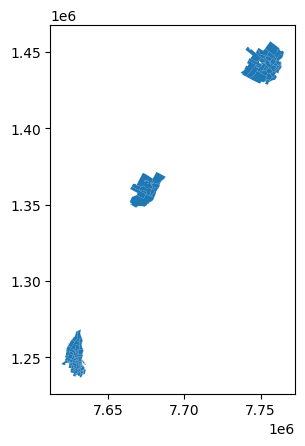

In [9]:
merged_gdf.plot()

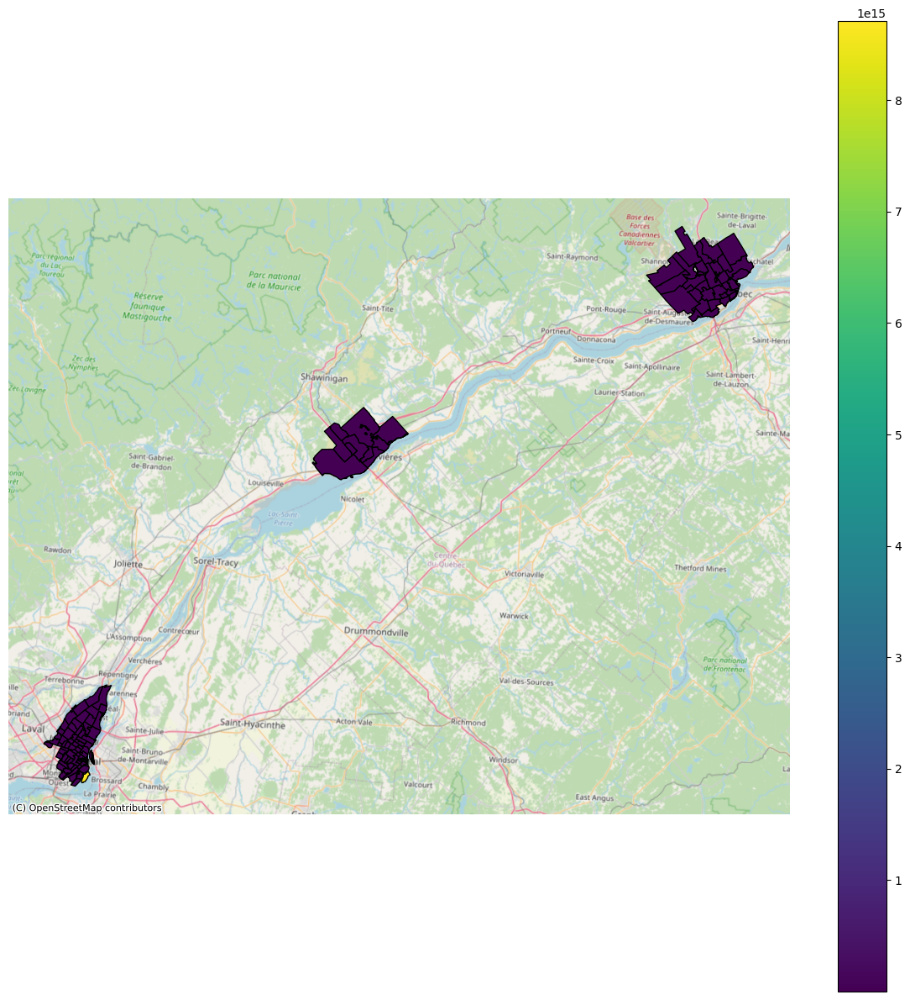

In [10]:
ut.plot_it(merged_gdf,column='kWh',legend=True)

<Axes: >

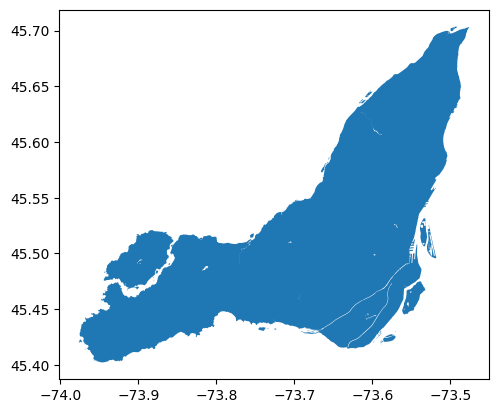

In [11]:
island=gpd.read_file(r'C:\Users\m_hamsai\Downloads\limites-terrestres.geojson')
island.plot()

In [12]:
merged_gdf=merged_gdf.to_crs('EPSG:4326').reset_index(drop=True)

In [13]:
merged_gdf

,CP3,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients,PRUID,PRNAME,geometry
0,G1B,5.654880e+08,84621.92,63164.81,138781.037,9.481166e+08,24,Quebec / Québec,"POLYGON ((-71.19100 46.89924, -71.19162 46.899..."
1,G1C,1.189313e+09,75048.31,120084.44,137366.149,2.272389e+09,24,Quebec / Québec,"POLYGON ((-71.17260 46.90513, -71.17218 46.904..."
2,G1E,8.377407e+08,60795.91,137156.86,136435.002,1.991653e+09,24,Quebec / Québec,"MULTIPOLYGON (((-71.16583 46.87275, -71.16549 ..."
3,G1G,8.022789e+08,73632.57,92503.33,135852.494,1.579271e+09,24,Quebec / Québec,"POLYGON ((-71.28937 46.89749, -71.29231 46.896..."
4,G1H,8.938786e+08,64562.10,153909.13,135565.085,2.019263e+09,24,Quebec / Québec,"POLYGON ((-71.25077 46.86931, -71.24948 46.868..."
...,...,...,...,...,...,...,...,...,...
100,H4B,4.043170e+08,41213.14,158508.46,135763.553,1.424888e+09,24,Quebec / Québec,"POLYGON ((-73.61250 45.46390, -73.61378 45.463..."
101,H4C,4.856290e+08,50294.06,135712.01,137533.987,1.381013e+09,24,Quebec / Québec,"POLYGON ((-73.57729 45.48062, -73.57714 45.480..."
102,H4E,8.439508e+08,55530.37,83326.41,137905.248,2.168721e+09,24,Quebec / Québec,"POLYGON ((-73.57325 45.47566, -73.57307 45.475..."
103,H4G,7.696592e+08,46331.02,78637.93,138167.003,2.365916e+09,24,Quebec / Québec,"MULTIPOLYGON (((-73.56119 45.47140, -73.56069 ..."


In [14]:
island['area']=island['geometry'].area
island

C:\Users\m_hamsai\AppData\Local\Temp\ipykernel_12968\1917107270.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  island['area']=island['geometry'].area


,DefaultAtt,geometry,area
0,NaN,"MULTIPOLYGON (((-73.56642 45.48518, -73.56611 ...",2.380083e-07
1,NaN,"MULTIPOLYGON (((-73.54413 45.47272, -73.54399 ...",4.241627e-04
2,NaN,"MULTIPOLYGON (((-73.55625 45.49088, -73.55599 ...",1.872201e-07
3,NaN,"MULTIPOLYGON (((-73.55190 45.49538, -73.55191 ...",1.937108e-06
4,NaN,"MULTIPOLYGON (((-73.53543 45.53026, -73.53543 ...",1.357174e-04
...,...,...,...
67,NaN,"MULTIPOLYGON (((-73.88024 45.47839, -73.88037 ...",4.830667e-07
68,NaN,"MULTIPOLYGON (((-73.87990 45.47510, -73.87998 ...",4.933979e-07
69,NaN,"MULTIPOLYGON (((-73.87533 45.48210, -73.87573 ...",5.755758e-06
70,NaN,"MULTIPOLYGON (((-73.86021 45.48984, -73.86027 ...",2.063403e-06


<Axes: >

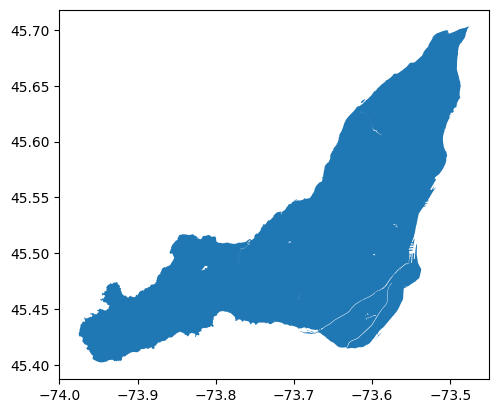

In [15]:
island_MTL=island.sort_values(by='area',ascending=False).head(1).reset_index(drop=True)
island_MTL.plot()

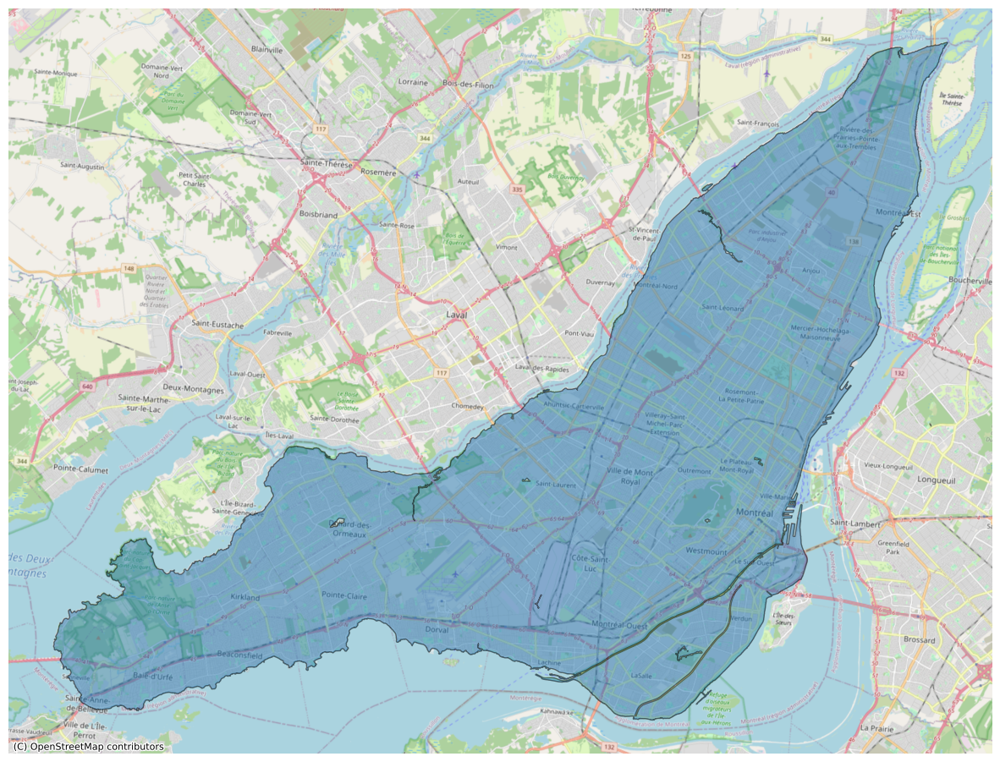

In [16]:
ut.plot_it(island_MTL,alpha=0.5)

In [21]:
island_MTL

,DefaultAtt,geometry,area
0,NaN,"MULTIPOLYGON (((-73.48417 45.70153, -73.48393 ...",0.053949


In [22]:
postal_codes_on_island = merged_gdf[merged_gdf.intersects(island_MTL.geometry[0])]
postal_codes_on_island


,CP3,kWh,kWh_Moyen,kWh_std,pctIntervals,nbClients,PRUID,PRNAME,geometry
39,H1A,9.318831e+08,65484.88,133510.90,138733.383,2.018395e+09,24,Quebec / Québec,"MULTIPOLYGON (((-73.47668 45.70214, -73.47722 ..."
40,H1B,6.259766e+08,66730.34,117751.12,138960.232,1.328807e+09,24,Quebec / Québec,"POLYGON ((-73.50219 45.65192, -73.50231 45.651..."
41,H1C,4.323861e+08,88817.68,77499.75,138525.597,6.917180e+08,24,Quebec / Québec,"POLYGON ((-73.50900 45.69807, -73.50900 45.698..."
42,H1E,1.385562e+09,85641.31,342229.01,138709.495,2.294790e+09,24,Quebec / Québec,"MULTIPOLYGON (((-73.57704 45.62832, -73.57717 ..."
43,H1G,1.272711e+09,60534.93,190360.63,138804.574,2.977853e+09,24,Quebec / Québec,"POLYGON ((-73.60477 45.62507, -73.60297 45.623..."
...,...,...,...,...,...,...,...,...,...
100,H4B,4.043170e+08,41213.14,158508.46,135763.553,1.424888e+09,24,Quebec / Québec,"POLYGON ((-73.61250 45.46390, -73.61378 45.463..."
101,H4C,4.856290e+08,50294.06,135712.01,137533.987,1.381013e+09,24,Quebec / Québec,"POLYGON ((-73.57729 45.48062, -73.57714 45.480..."
102,H4E,8.439508e+08,55530.37,83326.41,137905.248,2.168721e+09,24,Quebec / Québec,"POLYGON ((-73.57325 45.47566, -73.57307 45.475..."
103,H4G,7.696592e+08,46331.02,78637.93,138167.003,2.365916e+09,24,Quebec / Québec,"MULTIPOLYGON (((-73.56119 45.47140, -73.56069 ..."


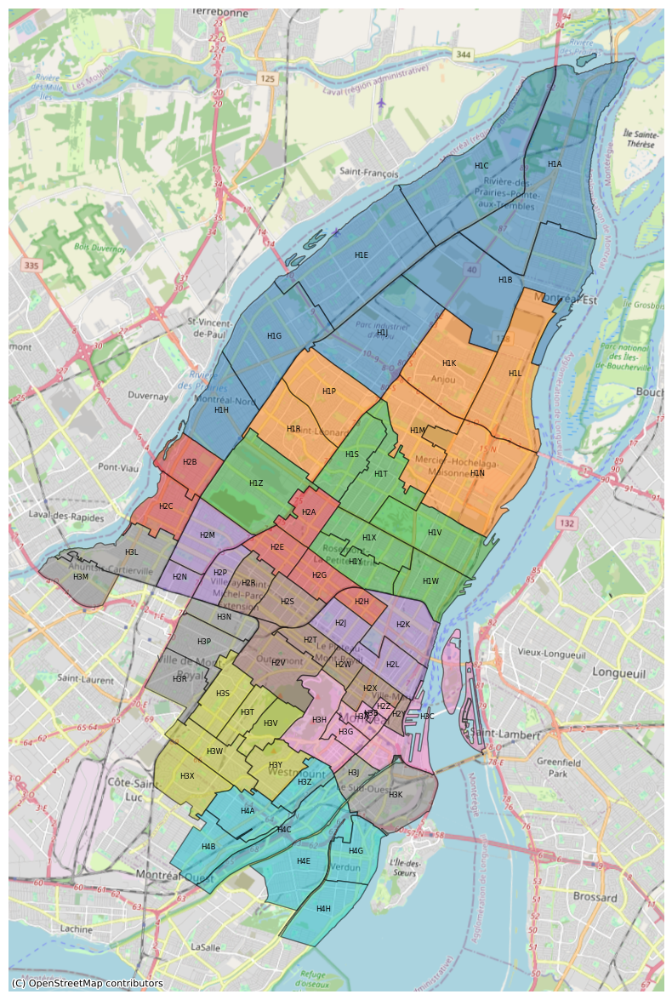

In [21]:
ut.plot_it(postal_codes_on_island,alpha=0.5,column='CP3',labeled=True)

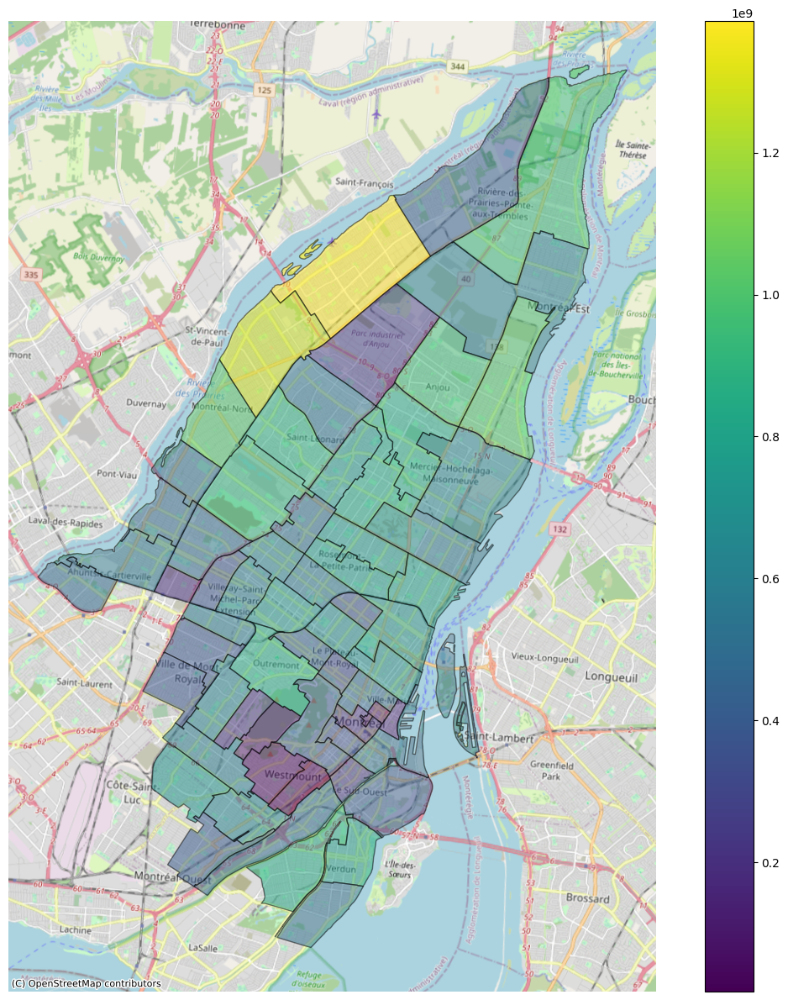

In [23]:
ut.plot_it(postal_codes_on_island,alpha=0.5,column='kWh',legend=True)

In [36]:
data_tracts=ut.tract_extract(x=-73.589693,y=45.508574,r=0.1)
data_tracts
# ut.plot_it(data_tracts,multipolygon=True,alpha=0.3,column="CTNAME",labeled=True)



Fetching Metadata. Please Wait ...
Tracts collection acquired
selecting 447 tracts in 11110 m radius of point -73.589693,45.508574


,CMANAME,CMAPUID,CMATYPE,CMAUID,CTNAME,CTUID,PRNAME,PRUID,geom,index
0,Montréal,24462,B,462,0137.00,462013700,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",304
1,Montréal,24462,B,462,0138.00,462013800,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",305
2,Montréal,24462,B,462,0034.00,462003400,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",306
3,Montréal,24462,B,462,0035.00,462003500,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",307
4,Montréal,24462,B,462,0036.00,462003600,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",308
...,...,...,...,...,...,...,...,...,...,...
442,Montréal,24462,B,462,0421.01,462042101,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",5236
443,Montréal,24462,B,462,0421.02,462042101,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",5237
444,Montréal,24462,B,462,0886.02,462088601,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",5322
445,Montréal,24462,B,462,0886.03,462088603,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",5323


there is 'geom' in columns


<Axes: >

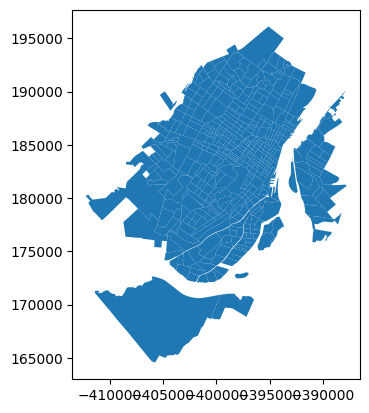

In [25]:
data_tracts_gdf=ut.geodataframe_of(data_tracts,multipolygon=True)
data_tracts_gdf.plot()

In [26]:
data_tracts_gdf=data_tracts_gdf.to_crs('EPSG:4326').reset_index(drop=True)

In [28]:
tracts_on_island = data_tracts_gdf[data_tracts_gdf.within(island_MTL.geometry[0])].reset_index(drop=True)
tracts_on_island

,CMANAME,CMAPUID,CMATYPE,CMAUID,CTNAME,CTUID,PRNAME,PRUID,geom,index,geometry
0,Montréal,24462,B,462,0137.00,462013700,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",304,"POLYGON ((-73.57849 45.51125, -73.57874 45.511..."
1,Montréal,24462,B,462,0138.00,462013800,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",305,"POLYGON ((-73.58099 45.51521, -73.58241 45.513..."
2,Montréal,24462,B,462,0034.00,462003400,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",306,"POLYGON ((-73.55265 45.53301, -73.55314 45.532..."
3,Montréal,24462,B,462,0035.00,462003500,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",307,"POLYGON ((-73.55428 45.53126, -73.55510 45.530..."
4,Montréal,24462,B,462,0036.00,462003600,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",308,"POLYGON ((-73.55676 45.52871, -73.55738 45.528..."
...,...,...,...,...,...,...,...,...,...,...,...
341,Montréal,24462,B,462,0120.01,462012001,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",4548,"POLYGON ((-73.64562 45.50155, -73.64660 45.500..."
342,Montréal,24462,B,462,0410.03,462041003,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",4655,"POLYGON ((-73.65414 45.52748, -73.65388 45.527..."
343,Montréal,24462,B,462,0415.04,462041504,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",4799,"POLYGON ((-73.68999 45.50842, -73.69173 45.506..."
344,Montréal,24462,B,462,0421.01,462042101,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",5236,"POLYGON ((-73.66520 45.53068, -73.66652 45.528..."


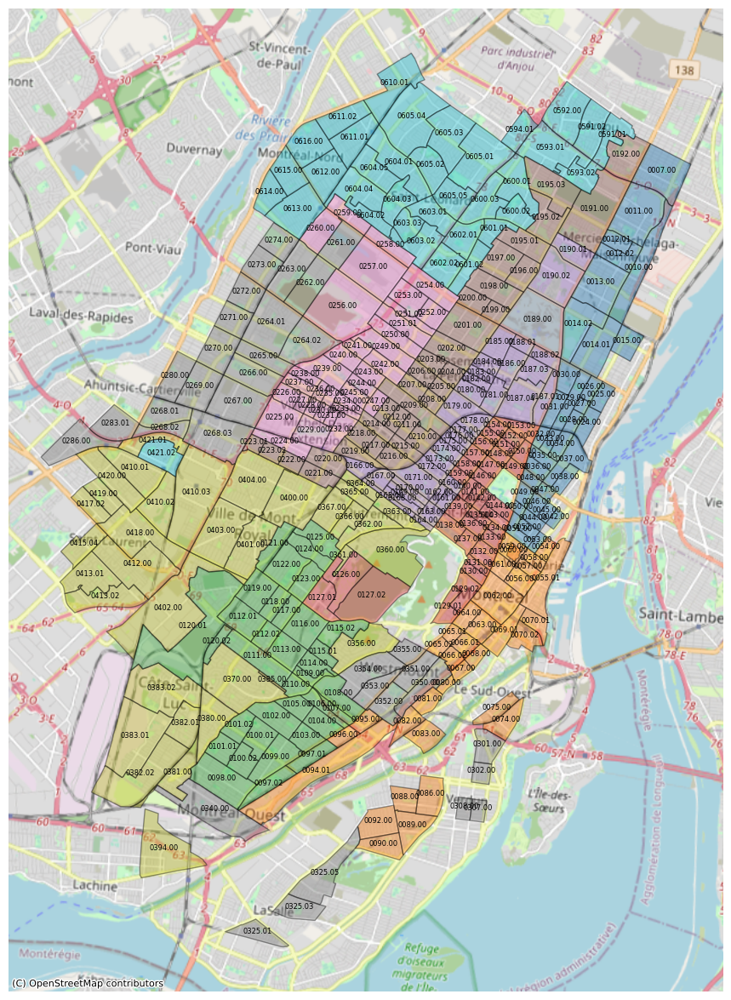

In [29]:
ut.plot_it(tracts_on_island,column='CTNAME',labeled=True,alpha=0.4)

In [30]:
temp_dic={}
list_1=[]
list_2=[]
for i in range(len(postal_codes_on_island)):
    print("i:",i)
    for j in range(len(tracts_on_island)):
        print("j:",j)
        postal_code=postal_codes_on_island.iloc[i,:]['geometry']
        CP3=postal_codes_on_island.iloc[i,:]['CP3']
        tract=tracts_on_island.iloc[j,:]['geometry'].centroid
        CTNAME=tracts_on_island.iloc[j,:]['CTNAME']

        if postal_code.contains(tract):
            list_1.append(CTNAME)
            list_2.append(CP3)            
            print(f"{j} is within {i}")
            
temp_dic["CTNAME"]=list_1
temp_dic["CP3"]=list_2

temp_dic

i: 0
j: 0
j: 1
j: 2
j: 3
j: 4
j: 5
j: 6
j: 7
j: 8
j: 9
j: 10
j: 11
j: 12
j: 13
j: 14
j: 15
j: 16
j: 17
j: 18
j: 19
j: 20
j: 21
j: 22
j: 23
j: 24
j: 25
j: 26
j: 27
j: 28
j: 29
j: 30
j: 31
j: 32
j: 33
j: 34
j: 35
j: 36
j: 37
j: 38
j: 39
j: 40
j: 41
j: 42
j: 43
j: 44
j: 45
j: 46
j: 47
j: 48
j: 49
j: 50
j: 51
j: 52
j: 53
j: 54
j: 55
j: 56
j: 57
j: 58
j: 59
j: 60
j: 61
j: 62
j: 63
j: 64
j: 65
j: 66
j: 67
j: 68
j: 69
j: 70
j: 71
j: 72
j: 73
j: 74
j: 75
j: 76
j: 77
j: 78
j: 79
j: 80
j: 81
j: 82
j: 83
j: 84
j: 85
j: 86
j: 87
j: 88
j: 89
j: 90
j: 91
j: 92
j: 93
j: 94
j: 95
j: 96
j: 97
j: 98
j: 99
j: 100
j: 101
j: 102
j: 103
j: 104
j: 105
j: 106
j: 107
j: 108
j: 109
j: 110
j: 111
j: 112
j: 113
j: 114
j: 115
j: 116
j: 117
j: 118
j: 119
j: 120
j: 121
j: 122
j: 123
j: 124
j: 125
j: 126
j: 127
j: 128
j: 129
j: 130
j: 131
j: 132
j: 133
j: 134
j: 135
j: 136
j: 137
j: 138
j: 139
j: 140
j: 141
j: 142
j: 143
j: 144
j: 145
j: 146
j: 147
j: 148
j: 149
j: 150
j: 151
j: 152
j: 153
j: 154
j: 155
j: 156
j: 157

{'CTNAME': ['0610.01',
  '0611.01',
  '0611.02',
  '0612.00',
  '0613.00',
  '0614.00',
  '0615.00',
  '0616.00',
  '0594.01',
  '0192.00',
  '0592.00',
  '0591.01',
  '0591.02',
  '0007.00',
  '0593.02',
  '0593.01',
  '0195.02',
  '0195.03',
  '0190.01',
  '0010.00',
  '0011.00',
  '0013.00',
  '0191.00',
  '0012.01',
  '0012.02',
  '0605.01',
  '0605.02',
  '0605.03',
  '0605.04',
  '0605.05',
  '0603.01',
  '0603.02',
  '0604.01',
  '0604.02',
  '0604.03',
  '0604.04',
  '0604.05',
  '0603.03',
  '0600.01',
  '0600.02',
  '0600.03',
  '0601.01',
  '0601.02',
  '0602.01',
  '0602.02',
  '0196.00',
  '0197.00',
  '0198.00',
  '0199.00',
  '0200.00',
  '0195.01',
  '0190.02',
  '0015.00',
  '0189.00',
  '0014.01',
  '0014.02',
  '0026.00',
  '0027.00',
  '0028.00',
  '0024.00',
  '0025.00',
  '0029.00',
  '0030.00',
  '0031.00',
  '0187.01',
  '0185.00',
  '0186.00',
  '0201.00',
  '0187.03',
  '0188.01',
  '0188.02',
  '0180.00',
  '0181.00',
  '0182.00',
  '0183.00',
  '0184.00',
  

In [31]:
pd.DataFrame(temp_dic)

,CTNAME,CP3
0,0610.01,H1G
1,0611.01,H1G
2,0611.02,H1G
3,0612.00,H1H
4,0613.00,H1H
...,...,...
306,0092.00,H4E
307,0308.00,H4G
308,0301.00,H4G
309,0302.00,H4G


In [32]:
tracts_on_island.shape

(346, 11)

In [33]:
tractes_and_CP3=pd.merge(tracts_on_island,pd.DataFrame(temp_dic),on='CTNAME')

<Axes: >

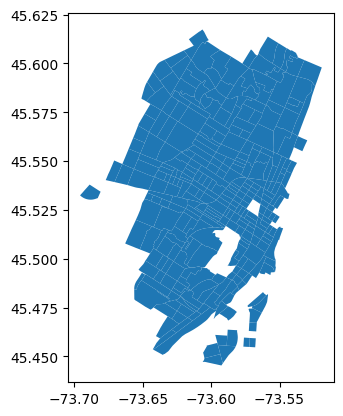

In [34]:
tractes_and_CP3_gdf=gpd.GeoDataFrame(tractes_and_CP3,geometry='geometry')
tractes_and_CP3_gdf.plot()

In [134]:
# Get the number of unique geometries in the GeoDataFrame
num_geometries = len(tractes_and_CP3_gdf.geometry.unique())

# Set the number of colors you want in the color cycle
num_colors = max(10, num_geometries)  # Choose a minimum of 10 colors or the number of geometries, whichever is larger

# Set the color cycle to a set of distinct colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.tab20.colors[:num_colors])


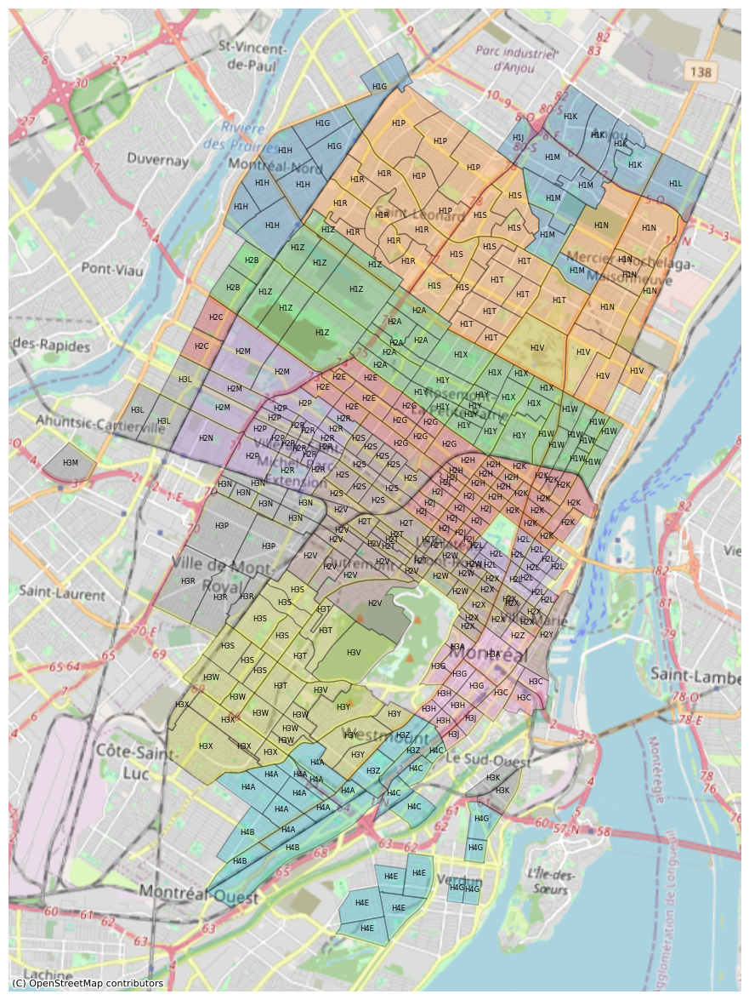

In [38]:
ut.plot_it(tractes_and_CP3_gdf,column='CP3',labeled=True,alpha=0.3)

In [89]:
postal_codes_on_island.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [90]:
tracts_on_island.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

C:\Users\m_hamsai\AppData\Local\Temp\ipykernel_11476\4082376498.py:19: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


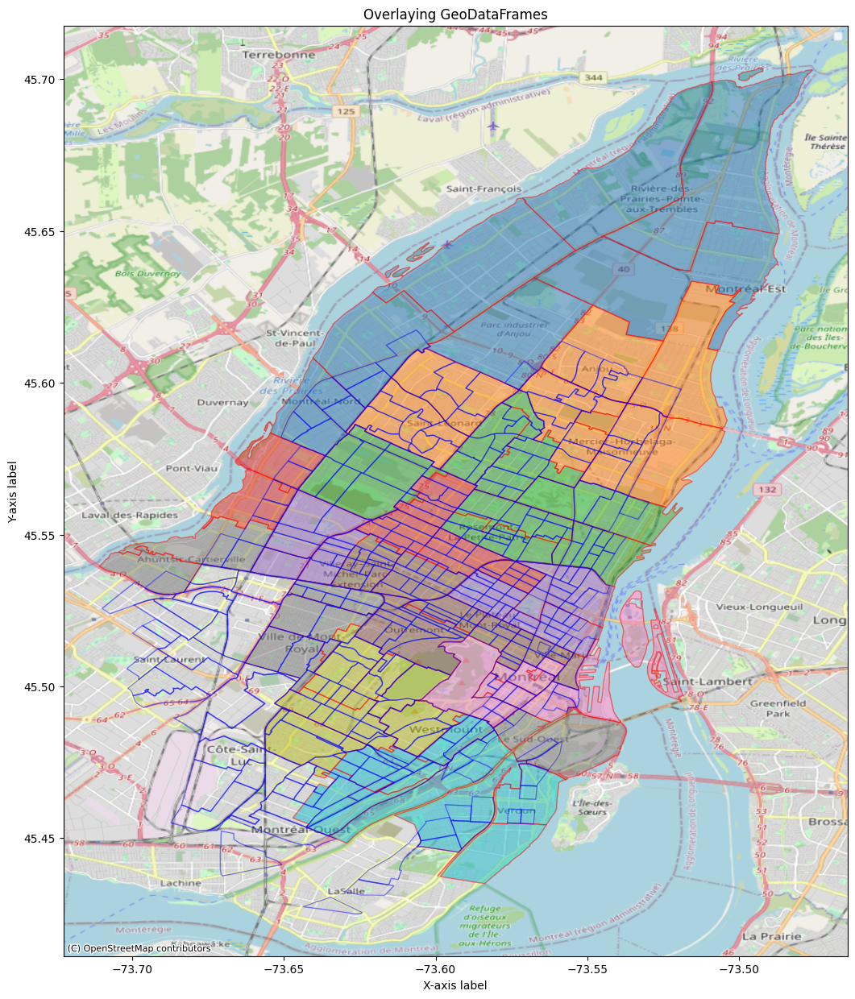

In [136]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Create a single axes for both plots
fig, ax = plt.subplots(figsize=(20, 15))

# Plot the first GeoDataFrame
postal_codes_on_island.plot(ax=ax, column='CP3', label='GeoDataFrame 1',alpha=0.5,edgecolor="red")

# Plot the second GeoDataFrame on the same axes
tracts_on_island.plot(ax=ax, color='none', label='GeoDataFrame 2',edgecolor="blue",alpha=0.5)

# Set axes labels and title
ax.set_xlabel('X-axis label')
ax.set_ylabel('Y-axis label')
ax.set_title('Overlaying GeoDataFrames')

# Add a legend
ax.legend()
cx.add_basemap(ax, crs=postal_codes_on_island.crs.to_string(),source=cx.providers.OpenStreetMap.Mapnik)
# Get the number of unique geometries in the GeoDataFrame
num_geometries = len(tractes_and_CP3_gdf.geometry.unique())

# Set the number of colors you want in the color cycle
num_colors = max(10, num_geometries)  # Choose a minimum of 10 colors or the number of geometries, whichever is larger

# Set the color cycle to a set of distinct colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.tab20.colors[:num_colors])
# Show the plot
plt.show()


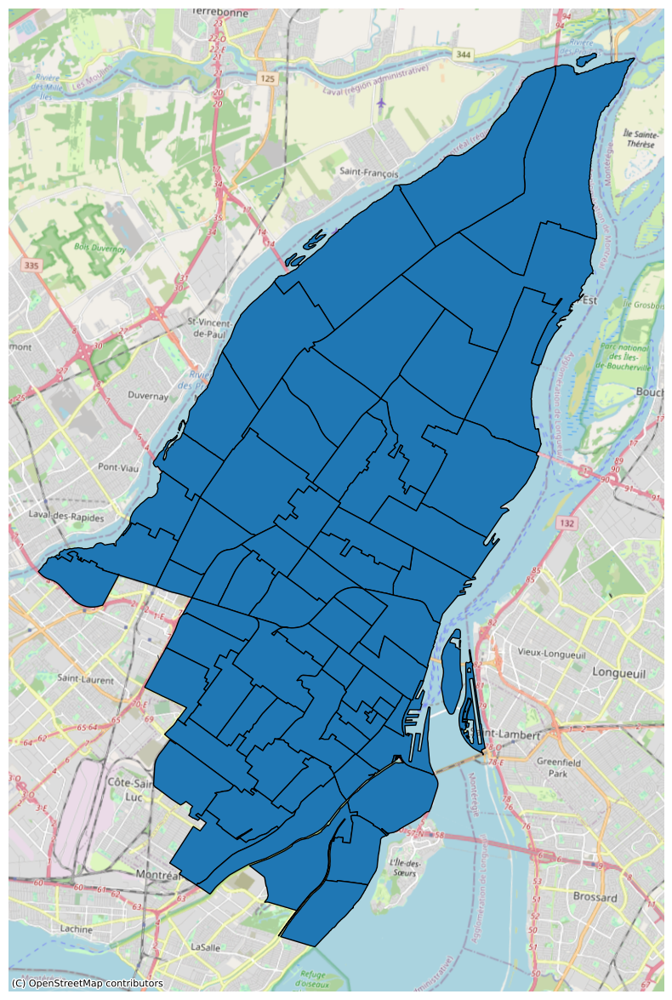

In [91]:
ut.plot_it(postal_codes_on_island)

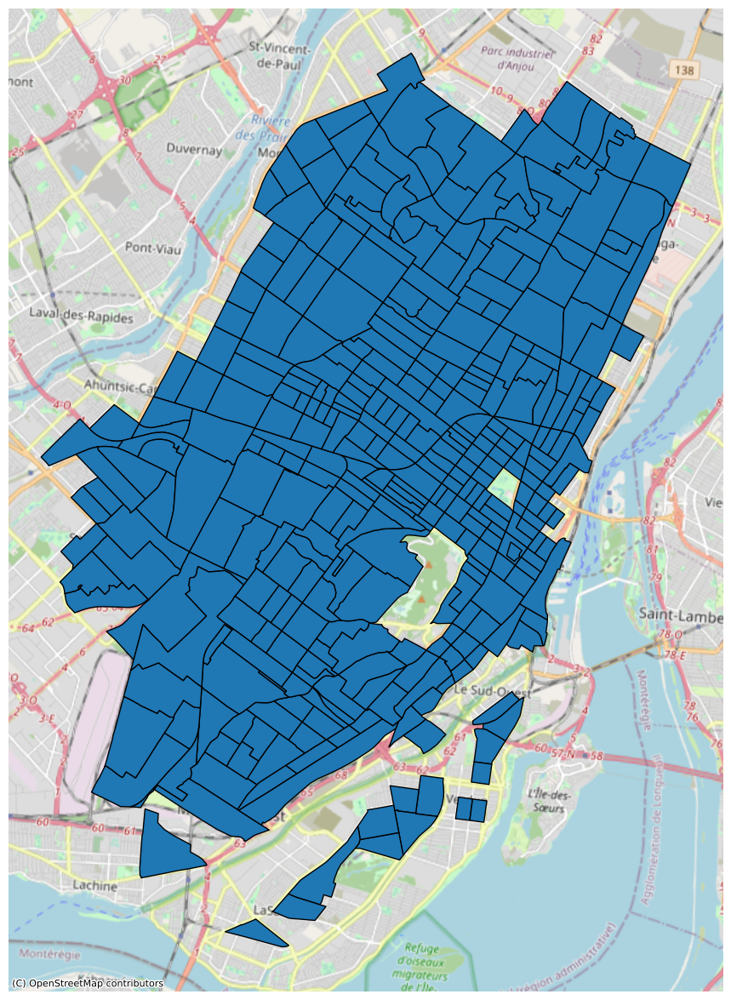

In [92]:
ut.plot_it(tracts_on_island)